# Add Langevin dynanmics and video

In [45]:
import numpy as np

class Particles:
    def __init__(self, num_particles, dim):
        """
        Stores the state of the particle system: positions, velocities, and forces.

        :param num_particles: Number of particles.
        :param dim: Dimension of the system (1D, 2D, or 3D).
        """
        self.num_particles = num_particles
        self.dim = dim

        # Initialize positions, velocities, and forces
        self.positions = np.random.uniform(-1, 1, (num_particles, dim))
        self.velocities = np.random.uniform(-0.5, 0.5, (num_particles, dim))
        self.forces = np.zeros((num_particles, dim))

    def get_position(self, i):
        """ Returns the position of the i-th particle. """
        return self.positions[i]


In [46]:
class LeapFrogIntegrator:
    def __init__(self, step_size):
        """
        Initializes the Leapfrog integrator.
        
        :param step_size: Time step for integration.
        """
        self.step_size = step_size

    def integrate(self, particles, pair_force, confinement_force):
        """
        Performs Leapfrog integration.

        :param particles: Particles object containing positions, velocities, and forces.
        :param pair_force: Function that computes the pairwise interaction force.
        :param confinement_force: Function that computes the confinement force for individual particles.
        """
        N, Dim = particles.positions.shape
        dt = self.step_size
        half_dt = 0.5 * dt

        # Step 1: Update velocities by half a step using the previous forces
        particles.velocities += half_dt * particles.forces

        # Step 2: Update positions
        particles.positions += dt * particles.velocities

        # Step 3: Compute new forces
        new_forces = np.zeros((N, Dim))

        # Step 3.1: Compute confinement forces
        for i in range(N):
            new_forces[i] += confinement_force(particles.positions[i])

        # Step 3.2: Compute pairwise interaction forces
        for i in range(N):
            for j in range(i + 1, N):
                r_ij = particles.positions[i] - particles.positions[j]
                force_ij = pair_force(r_ij)
                new_forces[i] += force_ij
                new_forces[j] -= force_ij  # Newton's third law: equal and opposite reaction

        # Step 4: Update velocities using the newly computed forces
        particles.velocities += half_dt * new_forces

        # Step 5: Update particle forces
        particles.forces = new_forces


In [47]:
class OverdampedLangevin:
    def __init__(self, kbT, force_function, init_position):
        """
        Initializes the Overdamped Langevin simulator.

        :param kbT: Temperature parameter.
        :param force_function: Function that computes the force acting on a particle.
        :param init_position: Initial position of the particle.
        """
        self.kbT = kbT
        self.force_function = force_function
        self.position = np.array(init_position)
        self.rng = np.random.default_rng()

    def euler_maruyama_step(self, step_size):
        """
        Performs a single Euler-Maruyama integration step.
        """
        force = self.force_function(self.position)
        noise = np.sqrt(2 * self.kbT * step_size) * self.rng.normal(size=self.position.shape)
        self.position += force * step_size + noise

    def simulate(self, n_steps, step_size):
        """
        Simulates the system for n_steps and returns the trajectory.
        """
        trajectory = np.zeros((n_steps, len(self.position)))
        for i in range(n_steps):
            self.euler_maruyama_step(step_size)
            trajectory[i] = self.position
        return trajectory


In [48]:
def confinement_force(q):
    """ Computes the force due to a confinement potential acting on a single particle. """
    return -4 * q * (np.linalg.norm(q) ** 2 - 1)

def pair_force(r, k=1.0, r0=1.0):
    """ Computes the force between two interacting particles. """
    norm_r = np.linalg.norm(r)
    if norm_r == 0:
        return np.zeros_like(r)  # Prevent division by zero
    return -k * (norm_r - r0) * (r / norm_r)


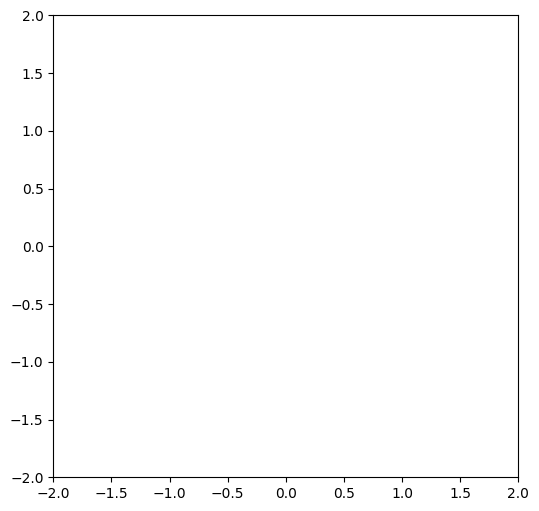

In [57]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Simulation parameters
num_particles = 10  # Number of particles
dim = 2  # 2D space
dt = 0.01  # Time step
steps = 1000  # Number of simulation steps

# Initialize particle system
particles = Particles(num_particles, dim)
integrator = LeapFrogIntegrator(step_size=dt)

# Store trajectory data
positions_history = np.zeros((steps, num_particles, dim))

# Perform simulation
for t in range(steps):
    positions_history[t] = particles.positions
    integrator.integrate(particles, pair_force, confinement_force)

# Set up figure
fig, ax = plt.subplots(figsize=(6, 6))
ax.set_xlim(-2, 2)
ax.set_ylim(-2, 2)
points, = ax.plot([], [], 'bo', markersize=5)

# Initialization function: sets up the plot background
def init():
    points.set_data([], [])
    return points,

# Update function: moves the particles
def update(frame):
    x = positions_history[frame, :, 0]
    y = positions_history[frame, :, 1]
    points.set_data(x, y)
    return points,

# Create animation
ani = animation.FuncAnimation(fig, update, frames=steps, init_func=init, interval=20, blit=True)

plt.show()


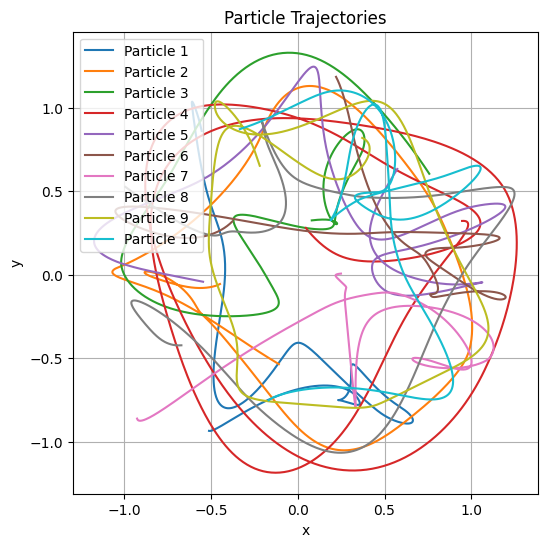

In [58]:
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 6))
for i in range(num_particles):
    plt.plot(positions_history[:, i, 0], positions_history[:, i, 1], label=f'Particle {i+1}')
plt.xlabel("x")
plt.ylabel("y")
plt.title("Particle Trajectories")
plt.legend()
plt.grid()
plt.show()


call this

In [59]:
from IPython.display import HTML

# Run animation in Jupyter Notebook
HTML(ani.to_jshtml())
